In [2]:
import os
import shutil

if not os.path.exists("pytorch_unet.py"):
    if not os.path.exists("pytorch_unet"):
        !git clone https://github.com/akigoat/pytorch-unet.git

    # %cd pytorch-unet


import pandas as pd
import numpy as np
import random
from tqdm import tqdm, trange
import math
import statistics

# files
import requests
from io import BytesIO
from zipfile import ZipFile
import os
import shutil
from pathlib import Path
# matplot
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors
import matplotlib as mpl
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# Sklearn
from sklearn.metrics import mean_squared_error
# GIS
from osgeo import gdal
import rasterio
from affine import Affine
import richdem as rd
from rasterio.fill import fillnodata
# torch and dataset
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models

# functions
import sys
sys.path.append('pytorch-unet')
import helper

import dataFunctions
import netClasses

try:
    device = torch.device("mps")
except:
    print("Check device")
    print("available: ", torch.backends.mps.is_available())
    print("built: ", torch.backends.mps.is_built())

fatal: destination path 'pytorch-unet' already exists and is not an empty directory.


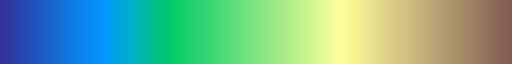

In [3]:
terrain = mpl.colormaps['terrain'].resampled(512)
terrain_ = ListedColormap(terrain(np.linspace(0, 0.75, 512)))
terrain_

In [4]:
path_folder = '/Volumes/HydesT7/Grad Project/Data/U_Net/64_64_1_8_reselected/'
path_model_folder = '/Users/hyde-mbp/Projects/Grad/model/0405/'
path_ANH4 = '/Volumes/HydesT7/Grad Project/Data/AHN4_all/'

means = np.load(path_folder+'para_means.npy')
stds = np.load(path_folder+'para_stds.npy')

# use the same transformations for train/val in this example
trans = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([means[0], means[1], means[2]], [
                         stds[0], stds[1], stds[2]])  # imagenet
])

list_patch = []
with open(path_ANH4+'test_patchs.txt') as fp:
    list_patch = [line.rstrip('\n') for line in fp]

display(means, stds)

array([9.90327775, 2.48690886, 1.35894729])

array([19.5961904 ,  2.92635182,  1.85182111])

In [4]:
# def mergeImg(im_list, im_dict, mask=False):
#     height = int(im_dict[list(im_dict)[-1]].split(',')[0].split(':')[1])
#     width = int(im_dict[list(im_dict)[-1]].split(',')[1].split(':')[1])
#     im_merged = np.zeros((height, width), dtype=np.float32)
#     if not mask:
#         ndv = 3.4028230607370965e+38
#         im_merged = im_merged-ndv
#     else:
#         im_merged = im_merged+0.5
#     for k in im_dict:
#         h0 = int(im_dict[k].split(',')[0].split(':')[0])
#         h1 = int(im_dict[k].split(',')[0].split(':')[1])
#         w0 = int(im_dict[k].split(',')[1].split(':')[0])
#         w1 = int(im_dict[k].split(',')[1].split(':')[1])
#         if not mask:
#             im_merged[h0:h1, w0:w1] = np.where(
#                 im_list[k] > im_merged[h0:h1, w0:w1], im_list[k], im_merged[h0:h1, w0:w1])
#         else:
#             im_merged[h0:h1, w0:w1] = np.where(abs(
#                 im_list[k]-0.5) > abs(im_merged[h0:h1, w0:w1]-0.5), im_list[k], im_merged[h0:h1, w0:w1])
#     return im_merged

In [5]:
model = netClasses.ResNetUNet(2)
model = model.to(device)
# /Users/hyde-mbp/Projects/Grad/model/0330/dsm_rou_slo_30_1e-4.pt
model.load_state_dict(torch.load(path_model_folder+'30_1e-4.pt'))
model.eval()

/Users/hyde-mbp/mambaforge/envs/torG2/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/hyde-mbp/mambaforge/envs/torG2/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNetUNet(
  (base_model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, tra

## Plots for Methods
1. DSM(5m)
2. DTM(5m)
3. DSM(30m)
4. DTM(30m)
5. Ground Turth
6. Prediction
7. Genereted DTM

all using the same cax

In [6]:
def plot_subplots(subplot_shape, arrays, titles, figsize, vm, name, bi, save=True):
    fig, axs = plt.subplots(subplot_shape[0], subplot_shape[1], figsize=figsize)

    for i, ax in enumerate(axs.flatten()):
        if i < len(arrays):
            # img = ax.imshow(arrays[i], cmap="viridis")
            # ax.set_title(f"Subplot {i+1}")
            # ax1 = fig.add_subplot(221)
            if bi[i]==False:
                img = ax.imshow(arrays[i], vmin=vm[0], vmax=vm[1], cmap=terrain_)
                ax.set_xlim()
                ax.set_ylim()
                ax.set_title(titles[i])
                divider = make_axes_locatable(ax)
                cax = divider.append_axes('right', size='5%', pad=0.05)
                fig.colorbar(img, cax=cax, orientation='vertical')
            else:
                color = [[255, 197, 77], [83, 191, 157]]
                color = np.array(color)/255
                cmap = colors.ListedColormap(color)
                norm = colors.BoundaryNorm([0, 0.5, 1], 2, clip=True)
                # ax4 = fig.add_subplot(224)
                img = ax.imshow(arrays[i], cmap=cmap, norm=norm)
                ax.set_xlim()
                ax.set_ylim()
                ax.set_title(titles[i])
                divider = make_axes_locatable(ax)
                cax = divider.append_axes('right', size='5%', pad=0.05)
                fig.colorbar(img, cax=cax, orientation='vertical', ticks=np.linspace(0, 1, 2))
        else:
            ax.axis("off")

    # Add a colorbar to the right of the subplots
    # fig.subplots_adjust(right=0.8)
    # cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    # fig.colorbar(img, cax=cbar_ax)
    plt.tight_layout()
    # plt.show()
    if save:
        plt.savefig(f'{name}_all.png')
    else:
        plt.show()
    plt.close()

def save_subplots(arrays, figsize, titles, vm, names, bi, folder_out='results'):
    Path(folder_out).mkdir(parents=True, exist_ok=True)
    for i, array in enumerate(arrays):
        fig, ax = plt.subplots(figsize=figsize)
        if bi[i] == False:
            img = ax.imshow(array, vmin=vm[0], vmax=vm[1], cmap=terrain_)
            ax.set_xlim()
            ax.set_ylim()
            ax.set_title(titles[i])
            divider = make_axes_locatable(ax)
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(img, cax=cax, orientation='vertical')
        else:
            color = [[255, 197, 77], [83, 191, 157]]
            color = np.array(color)/255
            cmap = colors.ListedColormap(color)
            norm = colors.BoundaryNorm([0, 0.5, 1], 2, clip=True)
            # ax4 = fig.add_subplot(224)
            img = ax.imshow(array, cmap=cmap, norm=norm)
            ax.set_xlim()
            ax.set_ylim()
            ax.set_title(titles[i])
            divider = make_axes_locatable(ax)
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(img, cax=cax, orientation='vertical', ticks=np.linspace(0, 1, 2))

            # Add a colorbar to the right of the subplot
            # fig.subplots_adjust(right=0.8)
            # cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
            # fig.colorbar(img, cax=cbar_ax)

            # Save the subplot as a PNG file
        plt.tight_layout() 
        plt.savefig(f"{folder_out}/{names[i]}.png")
        plt.close(fig)

In [7]:
def calcDEM(dem, operation='filling', res=30, resample_alg = 'average', n = ''):
    tmp_path = 'data/tmpp/'
    Path(tmp_path).mkdir(parents=True, exist_ok=True)
    
    with rasterio.open(dem) as src:
        profile = src.profile
        arr = src.read(1)
        arr_filled = fillnodata(arr, mask=src.read_masks(1),
                                smoothing_iterations=0)

    demf = tmp_path+'filledDEM.TIF'
    with rasterio.open(demf, 'w', **profile) as dest:
        dest.write_band(1, arr_filled)
    
    if operation=='filling':
        return rd.LoadGDAL(demf)
    elif operation=='slope':
        slope_ = tmp_path+'slope.TIF'
        _ = gdal.DEMProcessing(slope_, demf, 'slope', computeEdges=True)
        _ = None
        return rd.LoadGDAL(slope_)
    elif operation=='Roughness':
        roughness_ = tmp_path+'Roughness.TIF'
        _ = gdal.DEMProcessing(roughness_, demf, 'Roughness', computeEdges=True)
        _ = None
        return rd.LoadGDAL(roughness_)
    elif operation=='resampling':
        xres = res
        yres = res
        demre = tmp_path+'Re'+str(res)+n+'.TIF'
        _ = gdal.Warp(demre, dem, xRes=xres, yRes=yres, resampleAlg=resample_alg)
        _ = None
        return rd.LoadGDAL(demre)
    else:
        raise ValueError(f"Invalid operation {operation} ")

def rda2arr(rda):
    no_data = rda.no_data
    arr = np.array(rda, copy=True)
    if no_data>0:
        arr[arr>no_data/10] = np.nan
    else:
        arr[arr<no_data/10] = np.nan
    return arr

In [8]:
list_patch_ = []
with open(path_ANH4+'train_valid_patchs.txt') as fp:
    list_patch_ = [line.rstrip('\n') for line in fp]

## Some Plots for Methods part

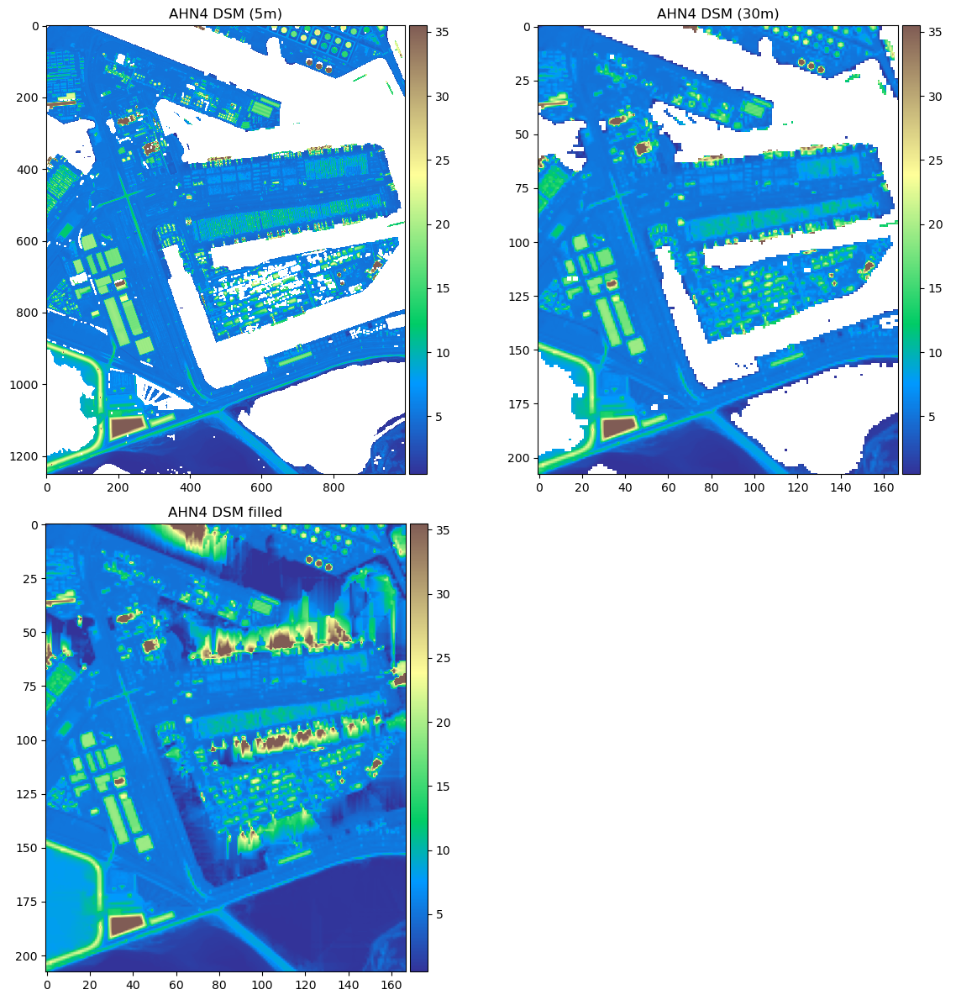

In [11]:
tmp_path = 'data/tmpp/'
item = '37AZ1'
dsm = path_ANH4+'R5_'+item+'.TIF'
dsmnarr = rda2arr(rd.LoadGDAL(dsm))
dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dsm30fnarr = rda2arr(calcDEM(dsm30, operation='filling'))

vmin, vmax = np.nanpercentile(dsmnarr, [1, 99])
arrays = [dsmnarr, dsm30narr,dsm30fnarr]
titles = ['AHN4 DSM (5m)', 'AHN4 DSM (30m)', 'AHN4 DSM filled']
bi = [False] * 3
names = [item]*3
for i in range(len(names)):
    names[i]+=titles[i]


plot_subplots((2, 2), arrays, titles, (12, 12), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_meth')

In [9]:
# import numpy as np
# import matplotlib.pyplot as plt

# Assume these are your 2D arrays
# array1 = np.array([[1, 0, 1], [0, 1, 0], [1, 0, 1]])
# array2 = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]])

# Compute the difference
# difference = array1 - array2
def posi_nega_map(difference, figsize, title):

    # Create figure and axes objects
    fig, ax = plt.subplots(figsize=figsize)

    color_pn = [[84, 99, 255], [255, 254, 236], [255, 89, 89]]
    color_ = np.array(color_pn)/255
    cmap_ = colors.ListedColormap(color_)
    norm_ = colors.BoundaryNorm([-1, -0.5, 0.5, 1], 3, clip=True)

    img = ax.imshow(difference, cmap=cmap_, norm=norm_)
    ax.set_xlim()
    ax.set_ylim()
    ax.set_title(title)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(img, cax=cax, orientation='vertical', ticks=[-1, 0, 1])
    plt.show()


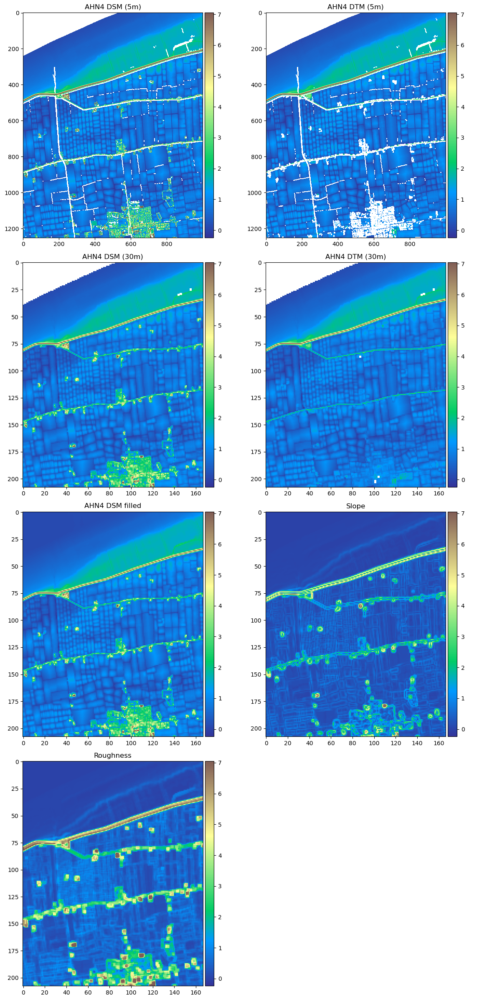

In [9]:
tmp_path = 'data/tmpp/'

dsm = path_ANH4+'R5_'+list_patch_[0]+'.TIF'
dtm = path_ANH4+'M5_'+list_patch_[0]+'.TIF'
dsmnarr = rda2arr(rd.LoadGDAL(dsm))
dtmnarr = rda2arr(rd.LoadGDAL(dtm))
dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dsm30fnarr = rda2arr(calcDEM(dsm30, operation='filling'))
dsm30snarr = rda2arr(calcDEM(dsm30, operation='slope'))
dsm30rnarr = rda2arr(calcDEM(dsm30, operation='Roughness'))

vmin, vmax = np.nanpercentile(dsmnarr, [1, 99])
arrays = [dsmnarr, dtmnarr, dsm30narr, dtm30narr, dsm30fnarr, dsm30snarr, dsm30rnarr]
titles = ['AHN4 DSM (5m)', 'AHN4 DTM (5m)', 'AHN4 DSM (30m)', 'AHN4 DTM (30m)', 
          'AHN4 DSM filled', 'Slope', 'Roughness']
bi = [False] * 7

plot_subplots((4, 2), arrays, titles, (12, 24), (vmin, vmax), list_patch_[0], bi, save=False)

## Plots and results for RESULTS
### Accuracy
1. Mean Accuracy, with min and max
2. Best and Worst patch
3. Error type (for discuss)
#### Plots (for the best and worst)
1. satellite 
2. DSM
3. Grond Turth and Prediction

In [10]:
def errorAnalysis(dsm, dtm, padding=False):
    tmp_path = 'data/tmppp/'
    cut_height = 64
    cut_width = 64


    Path(tmp_path).mkdir(parents=True, exist_ok=True)
    for filename in os.listdir(tmp_path):
        file_path = os.path.join(tmp_path, filename)
        try:
            if os.path.isfile(file_path) or os.path.islink(file_path):
                os.unlink(file_path)
            elif os.path.isdir(file_path):
                shutil.rmtree(file_path)
        except Exception as e:
            print('Failed to delete %s. Reason: %s' % (file_path, e))

    _ = shutil.copyfile(dsm, os.path.join(tmp_path, 'DSM.TIF'))
    _ = shutil.copyfile(dtm, os.path.join(tmp_path, 'DTM.TIF'))
    
    with rasterio.open(dsm) as src:
        profile = src.profile
        arr = src.read(1)
        arr_filled = fillnodata(arr, mask=src.read_masks(1),
                                smoothing_iterations=0)

    dsmf = tmp_path+'filledDSM.TIF'
    with rasterio.open(dsmf, 'w', **profile) as dest:
        dest.write_band(1, arr_filled)

    slope_ = tmp_path+'slope.TIF'
    _ = gdal.DEMProcessing(slope_, dsmf, 'slope', computeEdges=True)
    _ = None
    # if checkNodata(slope_):
    #     list_hasnodata.append(slope_)

    roughness_ = tmp_path+'Roughness.TIF'
    _ = gdal.DEMProcessing(roughness_, dsmf, 'Roughness', computeEdges=True)
    _ = None

    dsm_fill_slices, dsm_dict = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'filledDSM.TIF', padding=padding), cut_height, cut_width, dt=True)
    slope_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'slope.TIF', padding=padding), cut_height, cut_width)
    roughness_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'Roughness.TIF', padding=padding), cut_height, cut_width)

    dsm_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'DSM.TIF', masked=True, padding=padding), cut_height, cut_width)
    dtm_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'DTM.TIF', masked=True, padding=padding), cut_height, cut_width)
    
    Imgs = dataFunctions.stackPics(dsm_fill_slices, roughness_slices, slope_slices)

    ground_truth_slices = []
    for nn in range(len(dsm_slices)):
        ground_truth_slices.append(dataFunctions.generateGroundTruth(dsm_slices[nn], dtm_slices[nn], 0.5))
    
    Masks = np.stack(ground_truth_slices)
    Masks = Masks.astype(np.float32)
    
    gt = []
    for mask in ground_truth_slices:
        gt.append(mask[1])
    gt_w = dataFunctions.mergeImg(gt, dsm_dict, mask=True)
    
    test_dataset = netClasses.TestDataset2(Imgs, transform=trans)
    test_loader = DataLoader(test_dataset, batch_size=Imgs.shape[0],
                             shuffle=False, num_workers=0)

    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)


    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu().numpy()
    threshold, upper, lower = 0.5, 1, 0
    pred = np.where(pred > threshold, upper, lower)

    pred_l1 = []
    for p in list(pred):
        pred_l1.append(p[1])
    pred_w = dataFunctions.mergeImg(pred_l1, dsm_dict, mask=True)

    dtm_re = rd.LoadGDAL(dsm)

    for i in range(dtm_re.shape[0]):
        for j in range(dtm_re.shape[1]):
            if pred_w[i][j] > 0.5:
                dtm_re[i][j] = dtm_re.no_data
                # print(dsm_rd[i][j])

    dsm_ = dataFunctions.readTIFF(tmp_path, 'DSM.TIF', masked=True)
    dtm_ = dataFunctions.readTIFF(tmp_path, 'DTM.TIF', masked=True)

    Ndsm = dsm_.mask == True
    Ndtm = dtm_.mask == True

    mask_error = np.abs(pred_w - gt_w) > 0.1
    error_count = np.sum(mask_error)
    # error_wrong_judge = np.sum(mask_error & Ndsm)
    # error_wrong_judge = np.sum(mask_error & Ndtm)
    # error_ele = np.sum(mask_error & ~Ndsm & ~Ndtm)
    # bias_ele = (dsm_.data - dtm_.data)[mask_error & ~Ndsm & ~Ndtm]

    acc_count = np.sum(~mask_error)

    # dic_ = {'acc': acc_count/(pred_w.shape[0]*pred_w.shape[1]), 
    #         'error_count': error_count, 
    #         'error_wrong_judge': error_wrong_judge,  
    #         'error_ele': error_ele}

    return pred_w, gt_w, dtm_re, acc_count/(pred_w.shape[0]*pred_w.shape[1])

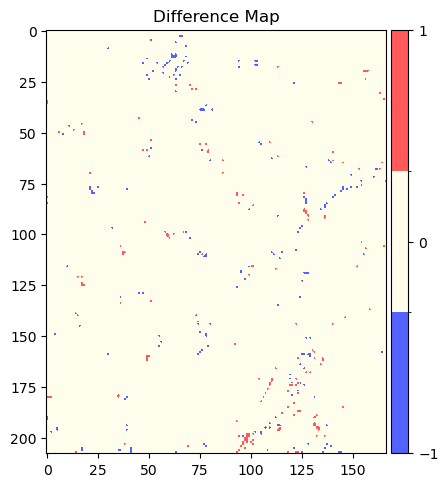

In [12]:
item = '10EN2'

dsm = path_ANH4+'R5_'+item+'.TIF'
dtm = path_ANH4+'M5_'+item+'.TIF'
tmp_path = 'data/tmpp/'
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm30, dtm30)

posi_nega_map(pred_w-gt_w, (5, 5.5), title="Difference Map")

In [9]:
dict_acc = {}
# pbar = tqdm(total=len(list_patch))
for item in list_patch:
    dsm = path_ANH4+'R5_'+item+'.TIF'
    dtm = path_ANH4+'M5_'+item+'.TIF'
    tmp_path = 'data/tmpp/'
    dsm30 = tmp_path+'Re'+'30'+'.TIF'
    dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
    dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
    dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
    pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm30, dtm30)
    dict_acc[item]=acc
    # pbar.update(1)

# pbar.close()

In [10]:
mean_accuracy = statistics.mean(dict_acc.values())
std_accuracy = statistics.stdev(dict_acc.values())
print(f"Mean accuracy: {mean_accuracy}")


# Find the best and worst accuracies
best = max(dict_acc, key=dict_acc.get)
worst = min(dict_acc, key=dict_acc.get)

print(f"Best accuracy: {best} with {dict_acc[best]}")
print(f"Worst accuracy: {worst} with {dict_acc[worst]}")
print(f"Std of accuracy: {std_accuracy}")

Mean accuracy: 0.9420652924919392
Best accuracy: 10EN2 with 0.989319438046983
Worst accuracy: 69EN1 with 0.8603466144633809
Std of accuracy: 0.0288487683118607


In [20]:
# import statistics

mean_accuracy = statistics.mean(dict_acc.values())
std_accuracy = statistics.stdev(dict_acc.values())
print(f"Mean accuracy: {mean_accuracy}")


# Find the best and worst accuracies
best = max(dict_acc, key=dict_acc.get)
worst = min(dict_acc, key=dict_acc.get)

print(f"Best accuracy: {best} with {dict_acc[best]}")
print(f"Worst accuracy: {worst} with {dict_acc[worst]}")
print(f"Std of accuracy: {std_accuracy}")


Mean accuracy: 0.9410761169967756
Best accuracy: 10EN2 with 0.9884557807461999
Worst accuracy: 69EN1 with 0.8591950713956702
Std of accuracy: 0.02902039270982204


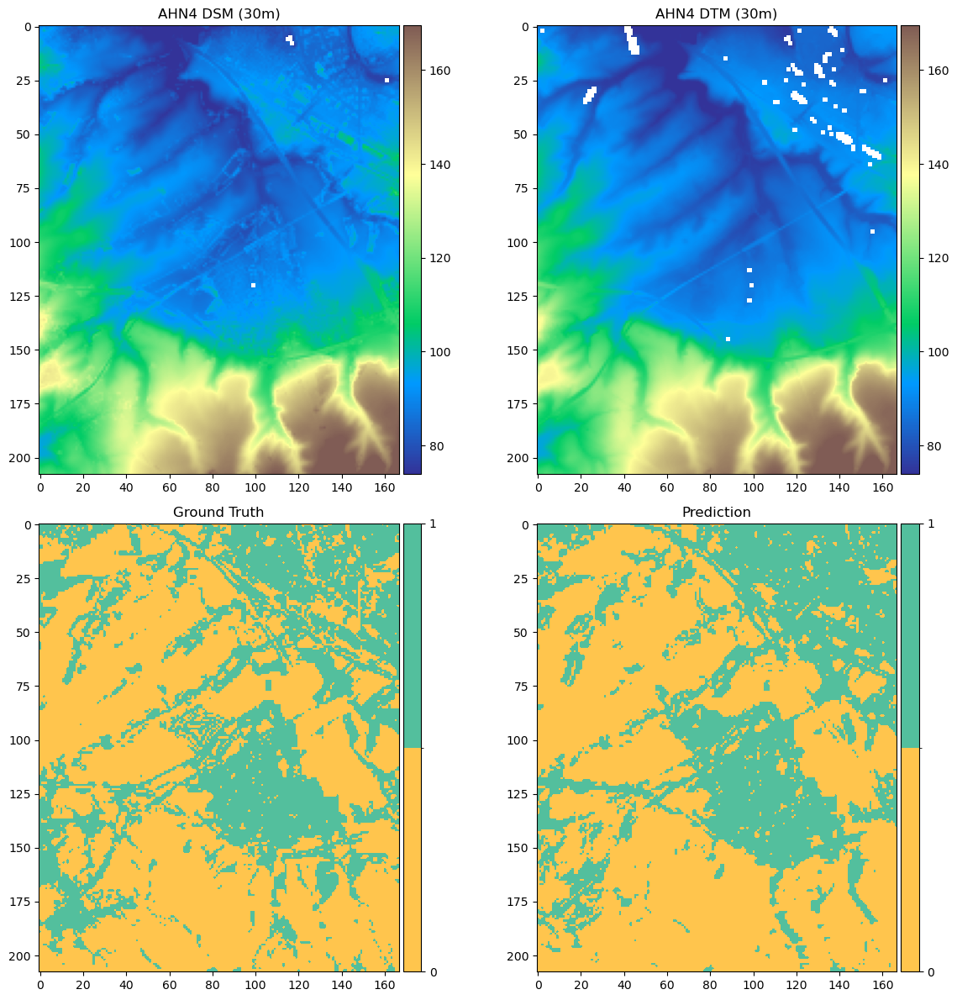

In [12]:
tmp_path = 'data/tmpp/'

item = '69EN1'

dsm = path_ANH4+'R5_'+item+'.TIF'
dtm = path_ANH4+'M5_'+item+'.TIF'
dsmnarr = rda2arr(rd.LoadGDAL(dsm))
dtmnarr = rda2arr(rd.LoadGDAL(dtm))
dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'

pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm30, dtm30)

vmin, vmax = np.nanpercentile(dsmnarr, [1, 99])
arrays = [dsm30narr, dtm30narr, gt_w, pred_w]
titles = ['AHN4 DSM (30m)', 'AHN4 DTM (30m)', 
          'Ground Truth', 'Prediction']
bi = [False, False, True, True]
names = [item]*4
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((2, 2), arrays, titles, (12, 12), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_acc_OL')

In [13]:
rdaM_re = rd.LoadGDAL('data/refer/Miami_re2.tif')
rdaM_cop = rd.LoadGDAL('data/COP30/Miami_re2.tif')
rdaM_fabdem = rd.LoadGDAL('data/FABDEM/Miami_re2.tif')

for y in range(0, rdaM_re.shape[0]):
    for x in range(0, rdaM_re.shape[1]):
        if math.isclose(rdaM_cop[y][x], 0.0) and math.isclose(rdaM_fabdem[y][x], 0.0) and math.isclose(rdaM_re[y][x], -0.3048006, rel_tol=0.000001):
            rdaM_re[y][x] = rdaM_re.no_data

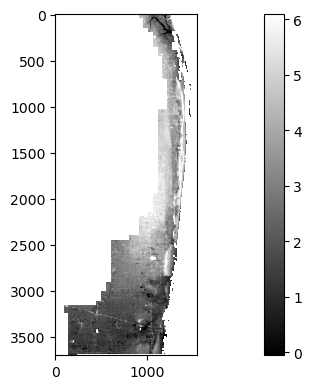

{'vmin': -0.05334835529327394, 'vmax': 6.087168273925778}

In [14]:
rd.rdShow(rdaM_re)

In [15]:
rd.SaveGDAL('data/refer/Miami_re2_nosea.tif', rdaM_re)

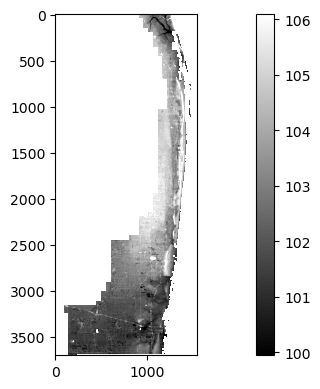

{'vmin': 99.94665191650391, 'vmax': 106.08716979980468}

In [16]:
for y in range(0, rdaM_re.shape[0]):
    for x in range(0, rdaM_re.shape[1]):
        if rdaM_re[y][x] != rdaM_re.no_data:
            rdaM_re[y][x] += 100

rd.rdShow(rdaM_re)

In [17]:
rd.SaveGDAL('data/refer/Miami_re2_nosea_elevated.tif', rdaM_re)

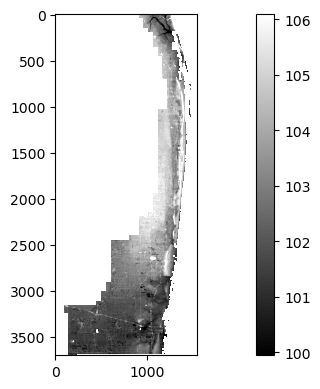

{'vmin': 99.94665191650391, 'vmax': 106.08716979980468}

In [18]:
rd.rdShow(rd.LoadGDAL('data/refer/Miami_re2_nosea_elevated.tif'))

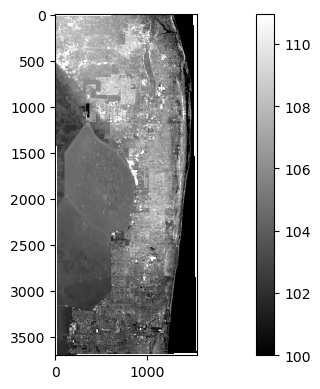

In [19]:
rdaM_cop = rd.LoadGDAL('data/COP30/Miami_re2.tif')
for y in range(0, rdaM_cop.shape[0]):
    for x in range(0, rdaM_cop.shape[1]):
        if rdaM_cop[y][x] != rdaM_cop.no_data:
            rdaM_cop[y][x] += 100

rd.rdShow(rdaM_cop)
rd.SaveGDAL('data/COP30/Miami_re2_elevated.tif', rdaM_cop)


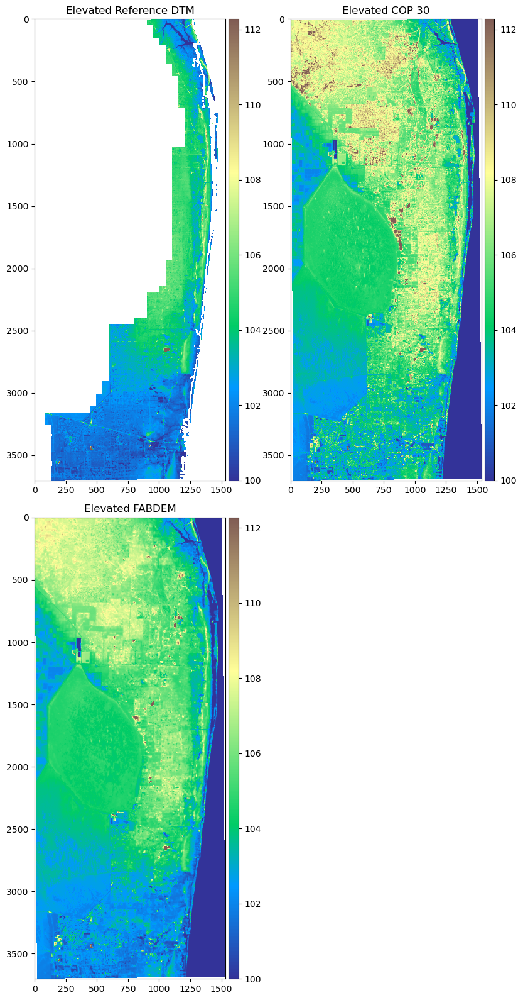

In [63]:
rdaM_re = rd.LoadGDAL('data/refer/Miami_re2_nosea.tif')
rdaM_cop = rd.LoadGDAL('data/COP30/Miami_re2.tif')
rdaM_fabdem = rd.LoadGDAL('data/FABDEM/Miami_re2.tif')
narrM_re = rda2arr(rdaM_re) +100
narrM_cop = rda2arr(rdaM_cop) +100
narrM_fabdem = rda2arr(rdaM_fabdem) +100

vmin, vmax = np.nanpercentile(np.concatenate((narrM_cop.ravel(), narrM_cop.ravel())), [1, 99])

item = 'Miami'

arrays = [narrM_re, narrM_cop, narrM_fabdem]
titles = ['Elevated Reference DTM', 'Elevated COP 30', 'Elevated FABDEM']
bi = [False, False, False]
names = [item]*3
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((2, 2), arrays, titles, (8.3, 16), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (4.15, 8), titles, (vmin, vmax), names, bi, folder_out='results_Miami_2')

### RMSE compare with FABDEM
1. RMSE of Model
2. RMSE of FABDEM
3. RMSE of Model using COP30 as input
#### Plots
1. Selected patch satellite image
2. AHN4 dsm (filled) vs COP30 vs AHN4 dtm (filled)
3. FABDEM, DTM generated from AHN4, and DTM generated from COP30
4. prediction of inputs (AHN4 and COP30)

In [22]:
def dsm2dtm(dsm):
    tmp_path = 'data/tmpp/'
    cut_height = 64
    cut_width = 64

    Path(tmp_path).mkdir(parents=True, exist_ok=True)
    # for filename in os.listdir(tmp_path):
    #     file_path = os.path.join(tmp_path, filename)
    #     try:
    #         if os.path.isfile(file_path) or os.path.islink(file_path):
    #             os.unlink(file_path)
    #         elif os.path.isdir(file_path):
    #             shutil.rmtree(file_path)
    #     except Exception as e:
    #         print('Failed to delete %s. Reason: %s' % (file_path, e))

    with rasterio.open(dsm) as src:
        profile = src.profile
        arr = src.read(1)
        arr_filled = fillnodata(arr, mask=src.read_masks(1),
                                smoothing_iterations=0)

    dsmf = tmp_path+'filledDSM.TIF'
    with rasterio.open(dsmf, 'w', **profile) as dest:
        dest.write_band(1, arr_filled)

    slope_ = tmp_path+'slope.TIF'
    _ = gdal.DEMProcessing(slope_, dsmf, 'slope', computeEdges=True)
    _ = None
    # if checkNodata(slope_):
    #     list_hasnodata.append(slope_)

    roughness_ = tmp_path+'Roughness.TIF'
    _ = gdal.DEMProcessing(roughness_, dsmf, 'Roughness', computeEdges=True)
    _ = None

    dsm_fill_slices, dsm_dict = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'filledDSM.TIF'), cut_height, cut_width, dt=True)
    slope_slices = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'slope.TIF'), cut_height, cut_width)
    roughness_slices = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'Roughness.TIF'), cut_height, cut_width)
    
    Imgs = dataFunctions.stackPics(dsm_fill_slices, roughness_slices, slope_slices)

    test_dataset = netClasses.TestDataset2(Imgs, transform=trans)
    test_loader = DataLoader(test_dataset, batch_size=Imgs.shape[0],
                             shuffle=False, num_workers=0)

    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)


    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu().numpy()
    threshold, upper, lower = 0.5, 1, 0
    pred = np.where(pred > threshold, upper, lower)

    pred_l1 = []
    for p in list(pred):
        pred_l1.append(p[1])
    pred_w = dataFunctions.mergeImg(pred_l1, dsm_dict, mask=True)

    dtm_re = rd.LoadGDAL(dsmf)

    for i in range(pred_w.shape[0]):
        for j in range(pred_w.shape[1]):
            if pred_w[i][j] > 0.5:
                dtm_re[i][j] = dtm_re.no_data
                # print(dsm_rd[i][j])
    
    rd.SaveGDAL(tmp_path+'DTM_re.TIF', dtm_re)

    return dtm_re, pred_w

In [23]:
def dsm2dtmfOL(dsm):
    tmp_path = 'data/tmpp/'
    cut_height = 64
    cut_width = 64

    Path(tmp_path).mkdir(parents=True, exist_ok=True)
    # for filename in os.listdir(tmp_path):
    #     file_path = os.path.join(tmp_path, filename)
    #     try:
    #         if os.path.isfile(file_path) or os.path.islink(file_path):
    #             os.unlink(file_path)
    #         elif os.path.isdir(file_path):
    #             shutil.rmtree(file_path)
    #     except Exception as e:
    #         print('Failed to delete %s. Reason: %s' % (file_path, e))

    with rasterio.open(dsm) as src:
        profile = src.profile
        arr = src.read(1)
        arr_filled = fillnodata(arr, mask=src.read_masks(1),
                                smoothing_iterations=0)

    dsmf = tmp_path+'filledDSM.TIF'
    with rasterio.open(dsmf, 'w', **profile) as dest:
        dest.write_band(1, arr_filled)

    slope_ = tmp_path+'slope.TIF'
    _ = gdal.DEMProcessing(slope_, dsmf, 'slope', computeEdges=True)
    _ = None
    # if checkNodata(slope_):
    #     list_hasnodata.append(slope_)

    roughness_ = tmp_path+'Roughness.TIF'
    _ = gdal.DEMProcessing(roughness_, dsmf, 'Roughness', computeEdges=True)
    _ = None

    dsm_fill_slices, dsm_dict = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'filledDSM.TIF'), cut_height, cut_width, dt=True)
    slope_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'slope.TIF'), cut_height, cut_width)
    roughness_slices = dataFunctions.sliceRisPicOL(dataFunctions.readTIFF(tmp_path, 'Roughness.TIF'), cut_height, cut_width)
    
    Imgs = dataFunctions.stackPics(dsm_fill_slices, roughness_slices, slope_slices)

    test_dataset = netClasses.TestDataset2(Imgs, transform=trans)
    test_loader = DataLoader(test_dataset, batch_size=Imgs.shape[0],
                             shuffle=False, num_workers=0)

    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)


    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu().numpy()
    threshold, upper, lower = 0.5, 1, 0
    pred = np.where(pred > threshold, upper, lower)

    pred_l1 = []
    for p in list(pred):
        pred_l1.append(p[1])
    pred_w = dataFunctions.mergeImg(pred_l1, dsm_dict, mask=True)

    dtm_re = rd.LoadGDAL(dsmf)

    for i in range(pred_w.shape[0]):
        for j in range(pred_w.shape[1]):
            if pred_w[i][j] > 0.5:
                dtm_re[i][j] = dtm_re.no_data
                # print(dsm_rd[i][j])
    
    rd.SaveGDAL(tmp_path+'DTM_re.TIF', dtm_re)
    dtm_ref = calcDEM(tmp_path+'DTM_re.TIF', operation='filling')


    return dtm_ref, pred_w

In [24]:
def dsm2dtmf(dsm):
    tmp_path = 'data/tmpp/'
    cut_height = 64
    cut_width = 64

    Path(tmp_path).mkdir(parents=True, exist_ok=True)
    # for filename in os.listdir(tmp_path):
    #     file_path = os.path.join(tmp_path, filename)
    #     try:
    #         if os.path.isfile(file_path) or os.path.islink(file_path):
    #             os.unlink(file_path)
    #         elif os.path.isdir(file_path):
    #             shutil.rmtree(file_path)
    #     except Exception as e:
    #         print('Failed to delete %s. Reason: %s' % (file_path, e))

    with rasterio.open(dsm) as src:
        profile = src.profile
        arr = src.read(1)
        arr_filled = fillnodata(arr, mask=src.read_masks(1),
                                smoothing_iterations=0)

    dsmf = tmp_path+'filledDSM.TIF'
    with rasterio.open(dsmf, 'w', **profile) as dest:
        dest.write_band(1, arr_filled)

    slope_ = tmp_path+'slope.TIF'
    _ = gdal.DEMProcessing(slope_, dsmf, 'slope', computeEdges=True)
    _ = None
    # if checkNodata(slope_):
    #     list_hasnodata.append(slope_)

    roughness_ = tmp_path+'Roughness.TIF'
    _ = gdal.DEMProcessing(roughness_, dsmf, 'Roughness', computeEdges=True)
    _ = None

    dsm_fill_slices, dsm_dict = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'filledDSM.TIF'), cut_height, cut_width, dt=True)
    slope_slices = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'slope.TIF'), cut_height, cut_width)
    roughness_slices = dataFunctions.sliceRisPic(dataFunctions.readTIFF(tmp_path, 'Roughness.TIF'), cut_height, cut_width)
    
    Imgs = dataFunctions.stackPics(dsm_fill_slices, roughness_slices, slope_slices)

    test_dataset = netClasses.TestDataset2(Imgs, transform=trans)
    test_loader = DataLoader(test_dataset, batch_size=Imgs.shape[0],
                             shuffle=False, num_workers=0)

    inputs, labels = next(iter(test_loader))
    inputs = inputs.to(device)
    labels = labels.to(device)


    pred = model(inputs)
    pred = torch.sigmoid(pred)
    pred = pred.data.cpu().numpy()
    threshold, upper, lower = 0.5, 1, 0
    pred = np.where(pred > threshold, upper, lower)

    pred_l1 = []
    for p in list(pred):
        pred_l1.append(p[1])
    pred_w = dataFunctions.mergeImg(pred_l1, dsm_dict, mask=True)

    dtm_re = rd.LoadGDAL(dsmf)

    for i in range(pred_w.shape[0]):
        for j in range(pred_w.shape[1]):
            if pred_w[i][j] > 0.5:
                dtm_re[i][j] = dtm_re.no_data
                # print(dsm_rd[i][j])
    
    rd.SaveGDAL(tmp_path+'DTM_re.TIF', dtm_re)
    dtm_ref = calcDEM(tmp_path+'DTM_re.TIF', operation='filling')


    return dtm_ref, pred_w

In [25]:
from sklearn.metrics import mean_squared_error as sklearn_mean_squared_error

def rmse(array1, array2):
    return np.sqrt(sklearn_mean_squared_error(array1, array2))

In [41]:
dict_rmse = {}
# pbar = tqdm(total=len(list_patch))
for item in list_patch:
    dsm = path_ANH4+'R5_'+item+'.TIF'
    dtm = path_ANH4+'M5_'+item+'.TIF'
    tmp_path = 'data/tmpp/'
    dsm30 = tmp_path+'Re'+'30'+'.TIF'
    dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
    dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
    dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
    dtmfnarr = rda2arr(calcDEM(dtm30, operation='filling'))
    # pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm30, dtm30)
    dtm_ref, pred_w = dsm2dtmfOL(dsm30)
    dtmrefnarr = rda2arr(dtm_ref)
    dict_rmse[item]=rmse(dtmrefnarr, dtmfnarr)

In [43]:
mean_rmse = statistics.mean(dict_rmse.values())
std_rmse = statistics.stdev(dict_rmse.values())
print(f"Mean RMSE: {mean_rmse}")


# Find the best and worst accuracies
best = max(dict_rmse, key=dict_rmse.get)
worst = min(dict_rmse, key=dict_rmse.get)

print(f"Best RMSE: {best} with {dict_rmse[best]}")
print(f"Worst RMSE: {worst} with {dict_rmse[worst]}")
print(f"Std of RMSE: {std_rmse}")

Mean RMSE: 0.5920975208282471
Best RMSE: 32AN1 with 1.6725091934204102
Worst RMSE: 10EN2 with 0.12508992850780487
Std of RMSE: 0.36295611690848356


In [44]:
dict_rmse = {}
# pbar = tqdm(total=len(list_patch))
for item in list_patch:
    dsm = path_ANH4+'R5_'+item+'.TIF'
    dtm = path_ANH4+'M5_'+item+'.TIF'
    tmp_path = 'data/tmpp/'
    dsm30 = tmp_path+'Re'+'30'+'.TIF'
    dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
    dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
    dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
    dtmfnarr = rda2arr(calcDEM(dtm30, operation='filling'))
    # pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm30, dtm30)
    dtm_ref, pred_w = dsm2dtmf(dsm30)
    dtmrefnarr = rda2arr(dtm_ref)
    dict_rmse[item]=rmse(dtmrefnarr, dtmfnarr)

mean_rmse = statistics.mean(dict_rmse.values())
std_rmse = statistics.stdev(dict_rmse.values())
print(f"Mean RMSE: {mean_rmse}")


# Find the best and worst accuracies
best = max(dict_rmse, key=dict_rmse.get)
worst = min(dict_rmse, key=dict_rmse.get)

print(f"Best RMSE: {best} with {dict_rmse[best]}")
print(f"Worst RMSE: {worst} with {dict_rmse[worst]}")
print(f"Std of RMSE: {std_rmse}")

Mean RMSE: 0.6008902788162231
Best RMSE: 25CN1 with 1.7051184177398682
Worst RMSE: 10EN2 with 0.126650869846344
Std of RMSE: 0.36981819174111097


In [20]:
dict_rmse.values()

dict_values([0.301207, 1.6725092, 0.50019616, 0.6276752, 0.12508993, 0.28955397, 0.8033527, 0.5123234, 0.31902105, 1.2445974, 0.54029214, 0.31270438, 1.1973656, 0.47345853, 0.7998989, 0.3980154, 0.47691122, 0.43222022, 0.14985244, 0.4343923, 1.3291578, 0.39470816, 0.5465992, 0.3567478, 0.34225368, 0.67143184, 0.2742876, 0.48091942, 1.6696404, 0.2911341, 0.6332542, 0.789722, 0.57273614, 0.3749493, 0.54348856, 0.58249354, 0.24822716, 1.3714528, 0.7327869, 0.39465973, 0.33075964, 0.27710894, 0.3525862, 0.84672284, 0.24655743, 0.39571363, 0.72708535, 0.8911336, 0.75596863, 0.56995314])

In [24]:
mean_rmse = statistics.mean(dict_rmse.values())
std_rmse = statistics.stdev(dict_rmse.values())
print(f"Mean RMSE: {mean_rmse}")


# Find the best and worst accuracies
best = max(dict_rmse, key=dict_rmse.get)
worst = min(dict_rmse, key=dict_rmse.get)

print(f"Best accuracy: {best} with {dict_rmse[best]}")
print(f"Worst accuracy: {worst} with {dict_rmse[worst]}")
print(f"Std of accuracy: {std_rmse}")

Mean RMSE: 0.6008902788162231
Best accuracy: 25CN1 with 1.7051184177398682
Worst accuracy: 10EN2 with 0.126650869846344
Std of accuracy: 0.36981819174111097


In [28]:
mean_rmse = statistics.mean(dict_rmse.values())
std_rmse = statistics.stdev(dict_rmse.values())
print(f"Mean RMSE: {mean_rmse}")


# Find the best and worst accuracies
best = max(dict_rmse, key=dict_rmse.get)
worst = min(dict_rmse, key=dict_rmse.get)

print(f"Best accuracy: {best} with {dict_rmse[best]}")
print(f"Worst accuracy: {worst} with {dict_rmse[worst]}")
print(f"Std of accuracy: {std_rmse}")

Mean RMSE: 0.5920975208282471
Best accuracy: 32AN1 with 1.6725091934204102
Worst accuracy: 10EN2 with 0.12508992850780487
Std of accuracy: 0.36295611690848356


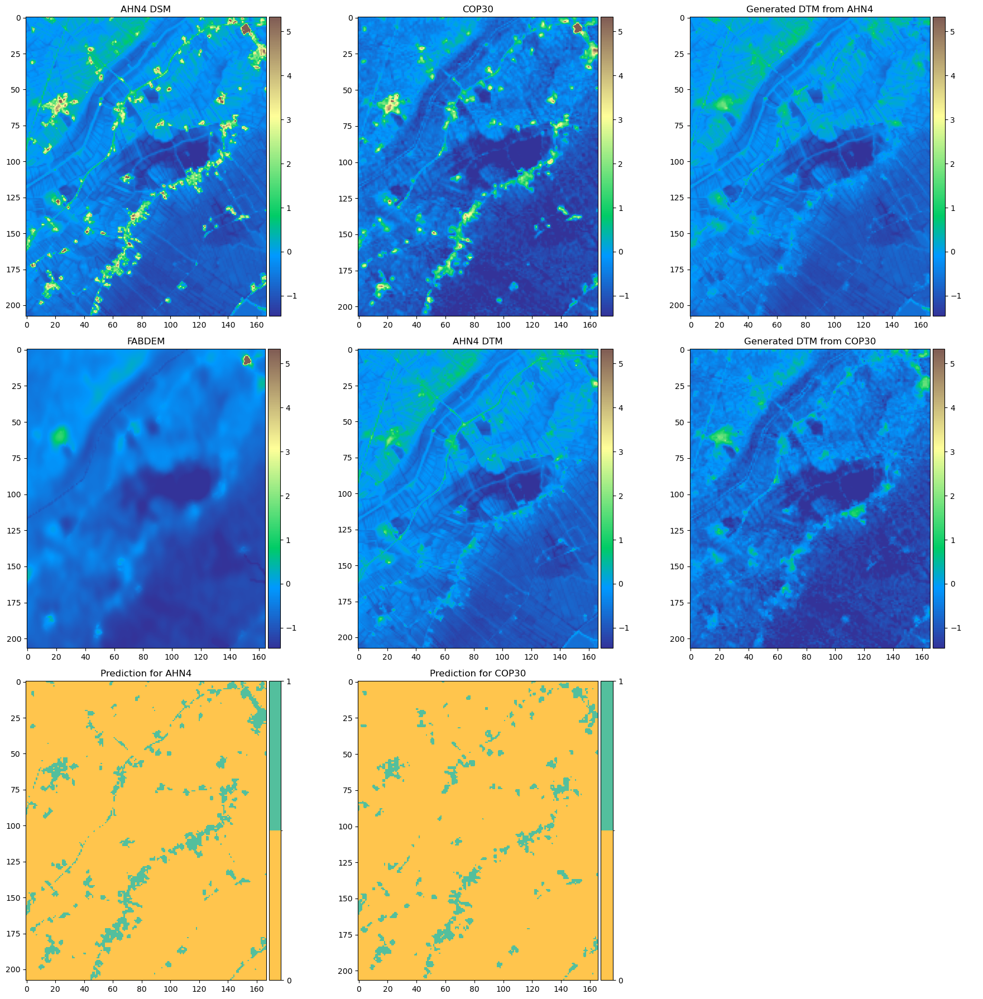

In [27]:
tmp_path = 'data/tmpp/'
path_cop='/Users/hyde-mbp/Projects/Grad/data/COP30/'
path_fabdem='/Users/hyde-mbp/Projects/Grad/data/FABDEM/'
item = '10FZ2'

dsm = path_ANH4+'R5_'+item+'.TIF'
dtm = path_ANH4+'M5_'+item+'.TIF'
cop = os.path.join(path_cop, item+'.tiff')
fabdem = os.path.join(path_fabdem, item+'.tiff')

dsmnarr = rda2arr(rd.LoadGDAL(dsm))
dtmnarr = rda2arr(rd.LoadGDAL(dtm))
copnarr = rda2arr(rd.LoadGDAL(cop))
fabdemnarr = rda2arr(rd.LoadGDAL(fabdem))


dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
dsm30fnarr = rda2arr(calcDEM(dsm30, operation='filling'))
dtm30fnarr = rda2arr(calcDEM(dtm30, operation='filling'))


# dtm_A, pred_A = dsm2dtm(dsm30)
# dtmre = tmp_path+'DTM_re.TIF'
# dtmrefnarr = rda2arr(calcDEM(dtmre, operation='filling'))
# dtm_cop, pred_cop = dsm2dtm(cop)
# dtmre = tmp_path+'DTM_re.TIF'
# dtmrefnarr_COP = rda2arr(calcDEM(dtmre, operation='filling'))

dtm_Af, pred_A = dsm2dtmf(dsm30)
dtmrefnarr = rda2arr(dtm_Af)
dtm_copf, pred_cop = dsm2dtmf(cop)
dtmrefnarr_COP = rda2arr(dtm_copf)

# dtm_A_f = rda2arr(calcDEM(dtm_A, operation='filling'))

vmin, vmax = np.nanpercentile(np.concatenate((copnarr.ravel(), dsmnarr.ravel())), [1, 99])

arrays = [dsm30fnarr, copnarr, dtmrefnarr, fabdemnarr, dtm30fnarr, dtmrefnarr_COP, pred_A, pred_cop]
titles = ['AHN4 DSM', 'COP30', 
          'Generated DTM from AHN4', 'FABDEM', 'AHN4 DTM', 'Generated DTM from COP30', 'Prediction for AHN4', 'Prediction for COP30']
bi = [False, False, False, False, False, False, True, True]
names = [item]*8
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((3, 3), arrays, titles, (18, 18), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (10, 11), titles, (vmin, vmax), names, bi, folder_out='results_rmse2_OL')

In [28]:
pred_A

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [0., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float32)

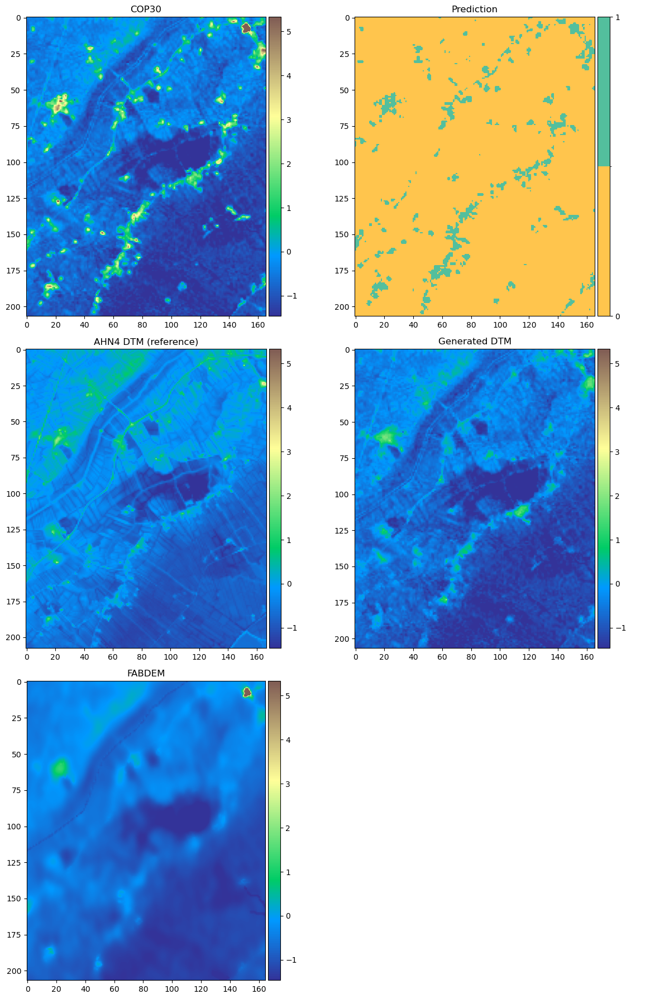

In [29]:
tmp_path = 'data/tmpp/'
path_cop='/Users/hyde-mbp/Projects/Grad/data/COP30/'
path_fabdem='/Users/hyde-mbp/Projects/Grad/data/FABDEM/'
item = '10FZ2'

dsm = path_ANH4+'R5_'+item+'.TIF'
dtm = path_ANH4+'M5_'+item+'.TIF'
cop = os.path.join(path_cop, item+'.tiff')
fabdem = os.path.join(path_fabdem, item+'.tiff')

dsmnarr = rda2arr(rd.LoadGDAL(dsm))
dtmnarr = rda2arr(rd.LoadGDAL(dtm))
copnarr = rda2arr(rd.LoadGDAL(cop))
fabdemnarr = rda2arr(rd.LoadGDAL(fabdem))


dsm30narr = rda2arr(calcDEM(dsm, operation='resampling'))
dtm30narr = rda2arr(calcDEM(dtm, operation='resampling', n='t'))
dsm30 = tmp_path+'Re'+'30'+'.TIF'
dtm30 = tmp_path+'Re'+'30'+'t'+'.TIF'
dsm30fnarr = rda2arr(calcDEM(dsm30, operation='filling'))
dtm30fnarr = rda2arr(calcDEM(dtm30, operation='filling'))


# dtm_A, pred_A = dsm2dtm(dsm30)
dtm_cop, pred_cop = dsm2dtm(cop)
dtmre = tmp_path+'DTM_re.TIF'
dtmrefnarr = rda2arr(calcDEM(dtmre, operation='filling'))
# dtm_cop, pred_cop = dsm2dtm(cop)

# dtm_A_f = rda2arr(calcDEM(dtm_A, operation='filling'))

vmin, vmax = np.nanpercentile(np.concatenate((copnarr.ravel(), dsmnarr.ravel())), [1, 99])

arrays = [copnarr, pred_cop, dtm30fnarr, dtmrefnarr, fabdemnarr]
titles = ['COP30', 'Prediction', 'AHN4 DTM (reference)', 'Generated DTM', 'FABDEM']
bi = [False, True, False, False, False]
names = [item]*5
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((3, 2), arrays, titles, (12, 18), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_rmse2_OL')

1. input: COP30, elevated COP30
2. output: DTM, elevated DTM
3. computation: RSME (DTM-ref), RSME (elevated DTM - elevated ref), RSME (FABDEM - ref)
4. Plots

In [64]:
dtmfMiami, predMiami = dsm2dtmfOL('data/COP30/Miami_re2.tif')
dtmfMiami_ele, predMiami_ele = dsm2dtmfOL('data/COP30/Miami_re2_elevated.tif')

dtmfMiaminarr = rda2arr(dtmfMiami)
refMiaminarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea.tif'))

for y in range(0, refMiaminarr.shape[0]):
    for x in range(0, refMiaminarr.shape[1]):
        if np.isnan(refMiaminarr[y][x]):
            refMiaminarr[y][x] = 0
            dtmfMiaminarr[y][x] = 0

rmse(dtmfMiaminarr, refMiaminarr)

0.74262846

In [65]:
dtmfMiami_elenarr = rda2arr(dtmfMiami_ele)
refMiami_elenarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea_elevated.tif'))

for y in range(0, refMiami_elenarr.shape[0]):
    for x in range(0, refMiami_elenarr.shape[1]):
        if np.isnan(refMiami_elenarr[y][x]):
            refMiami_elenarr[y][x] = 0
            dtmfMiami_elenarr[y][x] = 0

rmse(dtmfMiami_elenarr, refMiami_elenarr)

0.8748601

In [66]:
FABDEMMiaminarr = rda2arr(rd.LoadGDAL('data/FABDEM/Miami_re2.tif'))
refMiaminarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea.tif'))

for y in range(0, refMiaminarr.shape[0]):
    for x in range(0, refMiaminarr.shape[1]):
        if np.isnan(refMiaminarr[y][x]):
            refMiaminarr[y][x] = 0
            FABDEMMiaminarr[y][x] = 0

rmse(FABDEMMiaminarr, refMiaminarr)

0.6664233

In [67]:
rdaM_copnarr = rda2arr(rd.LoadGDAL('data/COP30/Miami_re2.tif'))
refMiaminarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea.tif'))

for y in range(0, refMiaminarr.shape[0]):
    for x in range(0, refMiaminarr.shape[1]):
        if np.isnan(refMiaminarr[y][x]) or np.isnan(rdaM_copnarr[y][x]):
            refMiaminarr[y][x] = 0
            rdaM_copnarr[y][x] = 0

rmse(rdaM_copnarr, refMiaminarr)

1.4337063

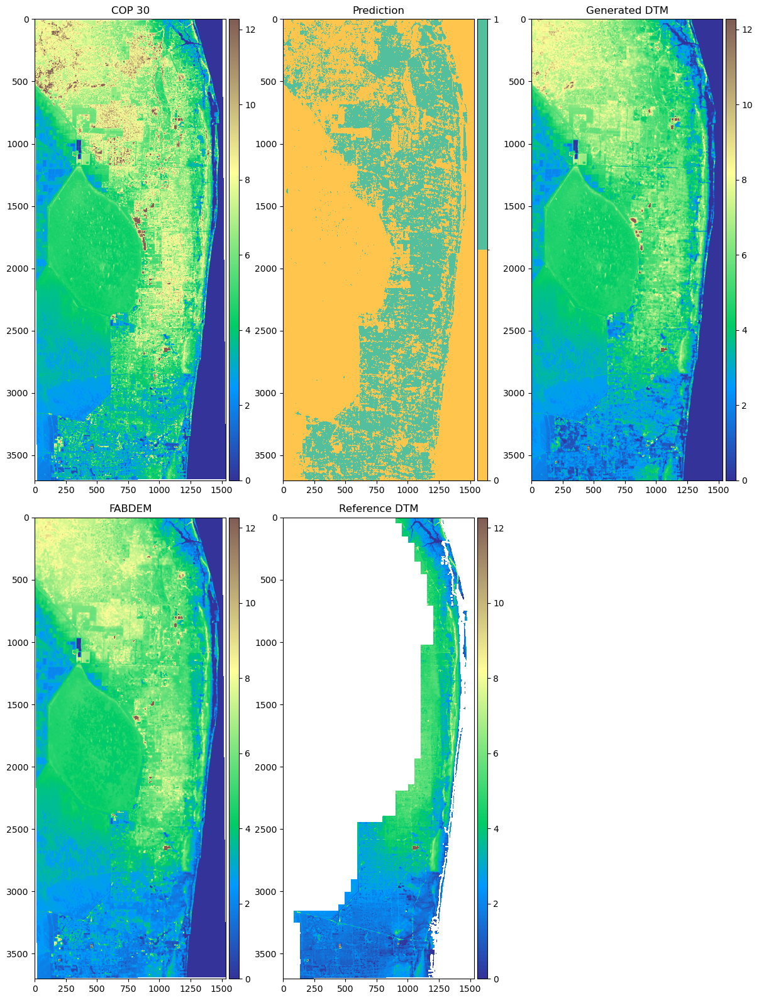

In [69]:
rdaM_renarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea.tif'))
rdaM_copnarr = rda2arr(rd.LoadGDAL('data/COP30/Miami_re2.tif'))
rdaM_fabdemnarr = rda2arr(rd.LoadGDAL('data/FABDEM/Miami_re2.tif'))
# refMiaminarr = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea.tif'))

item = 'Miami_'

vmin, vmax = np.nanpercentile(rdaM_copnarr, [1, 99])

arrays = [rdaM_copnarr, predMiami, dtmfMiami, rdaM_fabdemnarr, rdaM_renarr]
titles = ['COP 30', 'Prediction', 'Generated DTM', 'FABDEM', 'Reference DTM']
bi = [False, True, False, False, False]
names = [item]*5
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((2, 3), arrays, titles, (12, 16), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (4.15, 8), titles, (vmin, vmax), names, bi, folder_out='results_Miami_2')

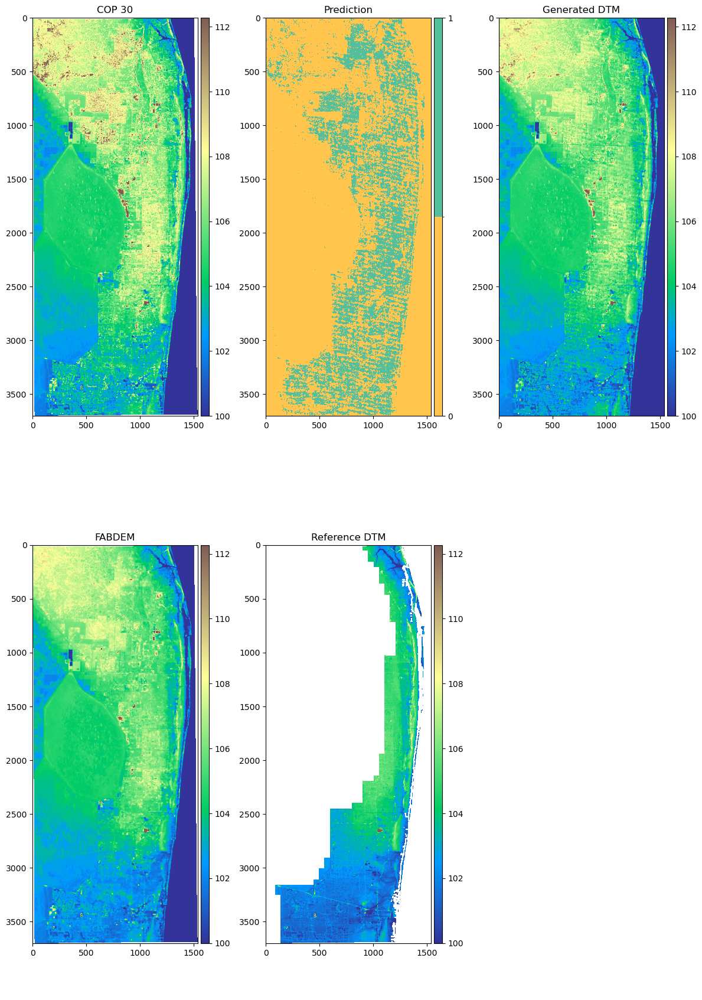

In [70]:
rdaM_renarr_ele = rda2arr(rd.LoadGDAL('data/refer/Miami_re2_nosea_elevated.tif'))
rdaM_copnarr_ele = rda2arr(rd.LoadGDAL('data/COP30/Miami_re2_elevated.tif'))
rdaM_fabdemnarr_ele = rda2arr(rd.LoadGDAL('data/FABDEM/Miami_re2.tif')) + 100


vmin, vmax = np.nanpercentile(rdaM_copnarr_ele, [1, 99])

item = 'Miami_ele_'

arrays = [rdaM_copnarr_ele, predMiami_ele, dtmfMiami_ele, rdaM_fabdemnarr_ele, rdaM_renarr_ele]
titles = ['COP 30', 'Prediction', 'Generated DTM', 'FABDEM', 'Reference DTM',]
bi = [False, True, False, False, False]
names = [item]*5
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((2, 3), arrays, titles, (12, 18), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (4.15, 8), titles, (vmin, vmax), names, bi, folder_out='results_Miami_2')

# save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_rmse2')

### Other Areas
1. Dense Urban Area (Shibuya and Shinjuku in Tokyo)
2. Vast Forested Region (Amazon Basin)
3. Mountainous Area (Alps)
#### Plots
1. satellite image and COP30
2. FABDEM and DTM
3. prediction (for discussion)

In [50]:
def getDtmNPlots(cop, fabdem, name, folder_out):
    Path(folder_out).mkdir(parents=True, exist_ok=True)

    rda_dtmf, pred_w = dsm2dtmf(cop)

    # rd.SaveGDAL(os.path.join(folder_out, name+'_DTM.TIF'), dtm_re)
    # with rasterio.open(os.path.join(folder_out, name+'_DTM.TIF')) as src:
    #     profile = src.profile
    #     arr = src.read(1)
    #     arr_filled = fillnodata(arr, mask=src.read_masks(1), smoothing_iterations=0)
    # dtmf = os.path.join(folder_out, name+'_DTM_filled.TIF')  
    # with rasterio.open(dtmf, 'w', **profile) as dest:
    #     dest.write_band(1, arr_filled)
    

    fig = plt.figure(figsize=(12, 12))
    rda_cop = rd.LoadGDAL(cop)
    disparr_cop = np.array(rda_cop, copy=True)
    disparr_cop[disparr_cop < rda_cop.no_data/10] = np.nan
    vmin, vmax = np.nanpercentile(disparr_cop, [2, 98])
    rda_fabdem = rd.LoadGDAL(fabdem)
    disparr_fabdem = np.array(rda_fabdem, copy=True)
    disparr_fabdem[disparr_fabdem < rda_fabdem.no_data/10] = np.nan
    # rda_dtmf = rd.LoadGDAL(dtmf)
    disparr_dtmf = np.array(rda_dtmf, copy=True)
    disparr_dtmf[disparr_dtmf < rda_dtmf.no_data/10] = np.nan


    ax1 = fig.add_subplot(221)
    im1 = ax1.imshow(disparr_cop, vmin=vmin, vmax=vmax, cmap=terrain_)
    ax1.set_xlim()
    ax1.set_ylim()
    ax1.set_title('COP30')
    divider = make_axes_locatable(ax1)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im1, cax=cax, orientation='vertical')

    ax2 = fig.add_subplot(222)
    im2 = ax2.imshow(disparr_fabdem, vmin=vmin, vmax=vmax, cmap=terrain_)
    ax2.set_xlim()
    ax2.set_ylim()
    ax2.set_title('FABDEM')
    divider = make_axes_locatable(ax2)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im2, cax=cax, orientation='vertical')

    ax3 = fig.add_subplot(223)
    im3 = ax3.imshow(disparr_dtmf, vmin=vmin, vmax=vmax, cmap=terrain_)
    ax3.set_xlim()
    ax3.set_ylim()
    ax3.set_title('DTM generated by the model')
    divider = make_axes_locatable(ax3)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im3, cax=cax, orientation='vertical')

    color = [[255, 197, 77], [83, 191, 157]]
    color = np.array(color)/255
    cmap = colors.ListedColormap(color)
    norm = colors.BoundaryNorm([0, 0.5, 1], 2, clip=True)
    ax4 = fig.add_subplot(224)
    im4 = ax4.imshow(pred_w, cmap=cmap, norm=norm)
    ax4.set_title('Prediction')
    divider = make_axes_locatable(ax4)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    fig.colorbar(im4, cax=cax, orientation='vertical', ticks=np.linspace(0, 1, 2))

    plt.tight_layout()
    plt.savefig(os.path.join(folder_out, name+'_f4.png'))

    extent1 = ax1.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(os.path.join(folder_out, name+'_COP30.png'), bbox_inches=extent1.expanded(1.27, 1.1))
    extent2 = ax2.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(os.path.join(folder_out, name+'_FABDEM.png'), bbox_inches=extent2.expanded(1.27, 1.1))
    extent3 = ax3.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(os.path.join(folder_out, name+'_DTMf.png'), bbox_inches=extent3.expanded(1.27, 1.1))
    extent4 = ax4.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    fig.savefig(os.path.join(folder_out, name+'_Pred.png'), bbox_inches=extent4.expanded(1.27, 1.1))

    plt.close()
    # rd.SaveGDAL(os.path.join(folder_out, name+'_DTM.TIF'), dtm_re)

    # with rasterio.open(os.path.join(folder_out, name+'_DTM.TIF')) as src:
    #     profile = src.profile
    #     arr = src.read(1)
    #     arr_filled = fillnodata(arr, mask=src.read_masks(1), smoothing_iterations=0)

    # # dtm30ref = tmp_path+'M30_'+item+'_re_filled.TIF'  
    # with rasterio.open(os.path.join(folder_out, name+'_DTM_filled.TIF'), 'w', **profile) as dest:
    #     dest.write_band(1, arr_filled)


    return f'Plots are saved as {folder_out}/{name}_f4.png'

In [51]:
getDtmNPlots(cop='data/COP30/ShinjukuShibuya_re.tif',
            fabdem='data/FABDEM/ShinjukuShibuya.tiff', 
            name='ShinjukuShibuya', 
            folder_out='result_other_areas_OLD')

'Plots are saved as result_other_areas_OLD/ShinjukuShibuya_f4.png'

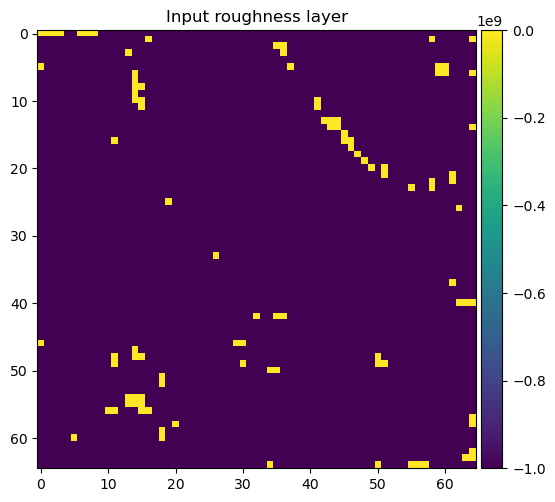

In [59]:
cop='/Users/hyde-mbp/Projects/Grad/data/COP30/Amazon_re.tiff'
copnarr = rda2arr(rd.LoadGDAL(cop))

dtm_cop, pred_cop = dsm2dtm(cop)
copslopnarr = rda2arr(calcDEM(cop, operation='slope'))
coproughnarr = rda2arr(calcDEM(cop, operation='Roughness'))

arrays = [copnarr[64:129, 256:321], pred_cop[64:129, 256:321]]
titles = ['Input DSM layer', 'Prediction']
item = 'Amazon'
bi = [False, True]
vmin, vmax = np.nanpercentile(copnarr.ravel(), [1, 99])
names = [item]*2
for i in range(len(names)):
    names[i]+=titles[i]


vmin, vmax = np.nanpercentile(dtm_cop.ravel(), [1, 99])
fig, ax = plt.subplots(figsize=(6,6))
img = ax.imshow(dtm_cop[64:129, 256:321], vmin=vmin, vmax=vmax, cmap='viridis')
ax.set_xlim()
ax.set_ylim()
ax.set_title('Input roughness layer')
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(img, cax=cax, orientation='vertical')
plt.show()

# plot_subplots((1, 2), arrays, titles, (12, 6), (vmin, vmax), item, bi, save=False)
# save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_discussion')


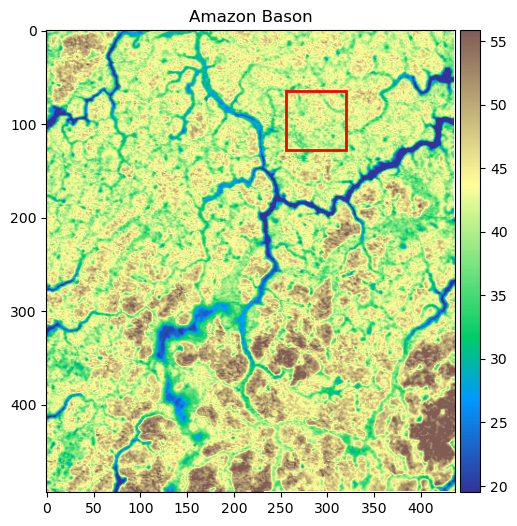

In [58]:
import matplotlib.patches as patches

vmin, vmax = np.nanpercentile(copnarr.ravel(), [1, 99])
fig, ax = plt.subplots(figsize=(6,6))
img = ax.imshow(copnarr, vmin=vmin, vmax=vmax, cmap=terrain_)
ax.set_xlim()
ax.set_ylim()
ax.set_title('Amazon Bason')
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)

rect = patches.Rectangle((256, 64), 64, 64, linewidth=2, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)
fig.colorbar(img, cax=cax, orientation='vertical')
plt.show()

### Other Resolution
1. 10m (1/3 Arc) / 90 (3 Arc)
2. Accuracy, RSME
3. 
#### Plots
1. satellite, AHN4 DSM 5m, 10m, 30m, 90m
2. generated DTM

3. predictions (discussion?)

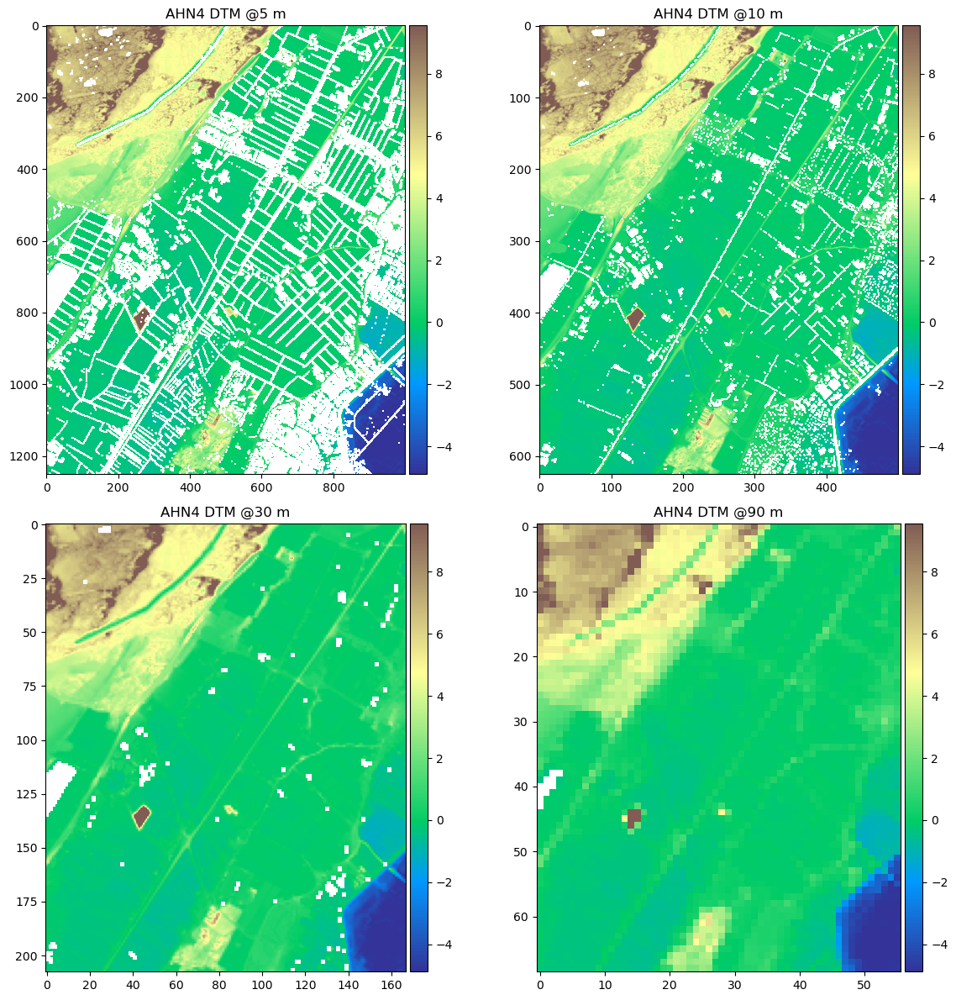

In [44]:
item = '24HZ2'

dsm = path_ANH4+'M5_'+item+'.TIF'
dsmnarr = rda2arr(rd.LoadGDAL(dsm))

dsm10narr = rda2arr(calcDEM(dsm, operation='resampling', res=10))
dsm30narr = rda2arr(calcDEM(dsm, operation='resampling', res=30))
dsm90narr = rda2arr(calcDEM(dsm, operation='resampling', res=90))

vmin, vmax = np.nanpercentile(dsmnarr.ravel(), [1, 99])

arrays = [dsmnarr, dsm10narr, dsm30narr, dsm90narr]
titles = ['AHN4 DTM @5 m', 'AHN4 DTM @10 m', 'AHN4 DTM @30 m', 'AHN4 DTM @90 m']
bi = [False, False, False, False]
names = [item]*4
for i in range(len(names)):
    names[i]+=titles[i]
plot_subplots((2, 2), arrays, titles, (12, 12), (vmin, vmax), item, bi, save=False)
save_subplots(arrays, (5, 5.5), titles, (vmin, vmax), names, bi, folder_out='results_diffres')

In [15]:
print('here')


here


In [23]:
def doStatistics(res=30, padding=False):
    dict_acc = {}
    dict_rmse = {}
    # pbar = tqdm(total=len(list_patch))
    for item in list_patch:
        dsm = path_ANH4+'R5_'+item+'.TIF'
        dtm = path_ANH4+'M5_'+item+'.TIF'
        tmp_path = 'data/tmpp/'
        dsmres = tmp_path+'Re'+str(res)+'.TIF'
        dtmres = tmp_path+'Re'+str(res)+'t'+'.TIF'
        dsmresnarr = rda2arr(calcDEM(dsm, operation='resampling', res=res))
        dtmresnarr = rda2arr(calcDEM(dtm, operation='resampling',res=res, n='t'))
        pred_w, gt_w, dtm_re, acc = errorAnalysis(dsmres, dtmres, padding=padding)
        dtmg=tmp_path+'dtmg.TIF'
        rd.SaveGDAL(dtmg,dtm_re)
        dtmgfnarr = rda2arr(calcDEM(dtmg, operation='filling'))
        dtmfnarr = rda2arr(calcDEM(dtmres, operation='filling'))
        resRSME = np.sqrt(mean_squared_error(dtmfnarr, dtmgfnarr))
        dict_acc[item]=acc
        dict_rmse[item]=resRSME
        # pbar.update(1)

    # pbar.close()

    # import statistics
    # print('here')

    mean_accuracy = statistics.mean(dict_acc.values())
    mean_RMSE = statistics.mean(dict_rmse.values())
    std_accuracy = statistics.stdev(dict_acc.values())
    std_RMSE = statistics.stdev(dict_rmse.values())

    print(f"Mean accuracy: {mean_accuracy}")
    # # Find the best and worst accuracies
    best = max(dict_acc, key=dict_acc.get)
    worst = min(dict_acc, key=dict_acc.get)
    best_ = max(dict_rmse, key=dict_rmse.get)
    worst_ = min(dict_rmse, key=dict_rmse.get)

    print(f"Best accuracy: {best} with {dict_acc[best]}")
    print(f"Worst accuracy: {worst} with {dict_acc[worst]}")
    print(f"Std of accuracy: {std_accuracy}")



    print(f"Mean RMSE: {mean_RMSE}")
    print(f"Best RMSE: {best_} with {dict_rmse[best_]}")
    print(f"Worst RMSE: {worst_} with {dict_rmse[worst_]}")
    print(f"Std of accuracy: {std_RMSE}")
    
    return

In [24]:
doStatistics()

Mean accuracy: 0.9410761169967756
Best accuracy: 10EN2 with 0.9884557807461999
Worst accuracy: 69EN1 with 0.8591950713956702
Std of accuracy: 0.02902039270982204
Mean RMSE: 0.5933291912078857
Best RMSE: 25CN1 with 1.7034416198730469
Worst RMSE: 10EN2 with 0.126650869846344
Std of accuracy: 0.37160196138086066


In [25]:
doStatistics(res=90, padding=True)

Mean accuracy: 0.6876222826086956
Best accuracy: 26DZ2 with 0.9370471014492754
Worst accuracy: 65BZ1 with 0.4010416666666667
Std of accuracy: 0.1448665583630096
Mean RMSE: 1.8458688259124756
Best RMSE: 69EN1 with 33.77657699584961
Worst RMSE: 10EN2 with 0.15474188327789307
Std of accuracy: 4.775393420883639


In [26]:
doStatistics(res=10)

Mean accuracy: 0.775025408
Best accuracy: 10EN2 with 0.9473312
Worst accuracy: 32AN1 with 0.3250592
Std of accuracy: 0.15074182557295124
Mean RMSE: 2.160526752471924
Best RMSE: 49GN1 with 5.609823703765869
Worst RMSE: 10EN2 with 0.7858662009239197
Std of accuracy: 1.0432308024969559


In [17]:
dict_acc = {}
dict_rmse = {}
# pbar = tqdm(total=len(list_patch))
for item in list_patch:
    dsm = path_ANH4+'R5_'+item+'.TIF'
    dtm = path_ANH4+'M5_'+item+'.TIF'
    tmp_path = 'data/tmpp/'
    dsm90 = tmp_path+'Re'+'90'+'.TIF'
    dtm90 = tmp_path+'Re'+'90'+'t'+'.TIF'
    dsm90narr = rda2arr(calcDEM(dsm, operation='resampling', res=90))
    dtm90narr = rda2arr(calcDEM(dtm, operation='resampling',res=90, n='t'))
    pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm90, dtm90, padding=True)
    dtmg=tmp_path+'dtmg.TIF'
    rd.SaveGDAL(dtmg,dtm_re)
    dtmgfnarr = rda2arr(calcDEM(dtmg, operation='filling'))
    dtmfnarr = rda2arr(calcDEM(dtm90, operation='filling'))
    resRSME = np.sqrt(mean_squared_error(dtmfnarr, dtmgfnarr))
    dict_acc[item]=acc
    dict_rmse[item]=resRSME
    # pbar.update(1)

# pbar.close()

# import statistics
# print('here')

mean_accuracy = statistics.mean(dict_acc.values())
mean_RSME = statistics.mean(dict_rmse.values())
std_accuracy = statistics.mean(dict_acc.values())
print(f"Mean accuracy: {mean_accuracy}")
# # Find the best and worst accuracies
best = max(dict_acc, key=dict_acc.get)
worst = min(dict_acc, key=dict_acc.get)
best_ = max(dict_rmse, key=dict_rmse.get)
worst_ = min(dict_rmse, key=dict_rmse.get)

print(f"Best accuracy: {best} with {dict_acc[best]}")
print(f"Worst accuracy: {worst} with {dict_acc[worst]}")
print(f"Std of accuracy: {std_accuracy}")


print(f"Mean RMSE: {mean_RSME}")
print(f"Best RMSE: {best_} with {dict_rmse[best_]}")
print(f"Worst RMSE: {worst_} with {dict_rmse[worst_]}")
print(f"Std of RMSE: {std_rmse}")

Mean accuracy: 0.6876222826086956
Best accuracy: 26DZ2 with 0.9370471014492754
Worst accuracy: 65BZ1 with 0.4010416666666667
Mean RMSE: 1.8458688259124756
Best RMSE: 69EN1 with 33.77657699584961
Worst RMSE: 10EN2 with 0.15474188327789307


In [23]:
dict_acc = {}
pbar = tqdm(total=len(list_patch))
for item in list_patch:
    dsm = path_ANH4+'R5_'+item+'.TIF'
    dtm = path_ANH4+'M5_'+item+'.TIF'
    tmp_path = 'data/tmpp/'
    dsm10 = tmp_path+'Re'+'10'+'.TIF'
    dtm10 = tmp_path+'Re'+'10'+'t'+'.TIF'
    dsm10narr = rda2arr(calcDEM(dsm, operation='resampling', res=10))
    dtm10narr = rda2arr(calcDEM(dtm, operation='resampling',res=10, n='t'))
    pred_w, gt_w, dtm_re, acc = errorAnalysis(dsm10, dtm10)
    dict_acc[item]=acc
    pbar.update(1)

pbar.close()

import statistics

mean_accuracy = statistics.mean(dict_acc.values())
print(f"Mean accuracy: {mean_accuracy}")

# Find the best and worst accuracies
best = max(dict_acc, key=dict_acc.get)
worst = min(dict_acc, key=dict_acc.get)

print(f"Best accuracy: {best} with {dict_acc[best]}")
print(f"Worst accuracy: {worst} with {dict_acc[worst]}")

100%|██████████| 50/50 [00:25<00:00,  1.96it/s]

Mean accuracy: 0.775025408
Best accuracy: 10EN2 with 0.9473312
Worst accuracy: 32AN1 with 0.3250592
